In [98]:
# get the permit data from the API
import json
import requests
import pandas as pd
import geopandas as gpd
from bs4 import BeautifulSoup
import numpy as np

In [4]:
# Read the CSV file into a Pandas DataFrame
df = pd.read_csv('Data/completed_dataset.csv')
pd.set_option('display.max_columns', None)
df.head(3)

,Unnamed: 0.1,Unnamed: 0,access_code,access_days_time,access_detail_code,cards_accepted,date_last_confirmed,expected_date,fuel_type_code,groups_with_access_code,id,open_date,owner_type_code,status_code,restricted_access,station_name,station_phone,updated_at,facility_type,geocode_status,latitude,longitude,city,intersection_directions,plus4,state,street_address,zip,country,bd_blends,cng_dispenser_num,cng_fill_type_code,cng_psi,cng_renewable_source,cng_total_compression,cng_total_storage,cng_vehicle_class,cng_has_rng,e85_blender_pump,e85_other_ethanol_blends,ev_connector_types,ev_dc_fast_num,ev_level1_evse_num,ev_level2_evse_num,ev_network,ev_network_web,ev_other_evse,ev_pricing,ev_renewable_source,hy_is_retail,hy_pressures,hy_standards,hy_status_link,lng_renewable_source,lng_vehicle_class,lng_has_rng,lpg_primary,lpg_nozzle_types,ng_fill_type_code,ng_psi,ng_vehicle_class,rd_blends,rd_blends_fr,rd_blended_with_biodiesel,rd_max_biodiesel_level,nps_unit_name,access_days_time_fr,intersection_directions_fr,bd_blends_fr,groups_with_access_code_fr,ev_pricing_fr,ev_network_ids,federal_agency
0,0,0,public,NaN,NaN,NaN,2023-04-30,NaN,ELEC,Public,117709.0,2019-02-07,NaN,E,NaN,Bexco Enterprises,888-998-2546,2023-05-01T00:00:10Z,NaN,GPS,33.979264,-118.105339,Pico Rivera,Charger #640 under repair. Chargers ||availabl...,NaN,CA,8700 Rex Rd,90660.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,4.0,Blink Network,http://www.blinkcharging.com/,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,{'station': ['465ba1dd-d734-8158-93cc-33000041...,NaN
1,1,1,public,24 hours daily,NaN,NaN,2023-05-01,NaN,ELEC,Public,185373.0,2021-02-25,NaN,E,NaN,"Walmart 2886 (Pico Rivera, CA)",833-632-2778,2023-05-01T00:54:14Z,NaN,GPS,33.986450,-118.104950,Pico Rivera,NaN,NaN,CA,8500 WASHINGTON BLVD,90660.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['CHADEMO', 'J1772COMBO']",4.0,NaN,NaN,Electrify America,https://www.electrifyamerica.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,"{'station': ['210019'], 'posts': ['210019-01',...",NaN
2,2,2,public,Mon 5:00am - 10:59pm; Tue 5:00am - 10:59pm; We...,NaN,NaN,2023-05-01,NaN,ELEC,Public,197430.0,2021-10-07,NaN,E,False,Pico Rivera Towne Center,888-264-2208,2023-05-01T01:44:37Z,NaN,GPS,33.984130,-118.099941,Pico Rivera,NaN,NaN,CA,8982 Washington Blvd,90660.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,2.0,Volta,https://voltacharging.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,{'station': ['426696ba-2bb3-4da7-9425-22ecfc8c...,NaN


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 74 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Unnamed: 0.1                3960 non-null   int64   
 1   Unnamed: 0                  3960 non-null   int64   
 2   access_code                 3960 non-null   object  
 3   access_days_time            3626 non-null   object  
 4   access_detail_code          128 non-null    object  
 5   cards_accepted              132 non-null    object  
 6   date_last_confirmed         3955 non-null   object  
 7   expected_date               313 non-null    object  
 8   fuel_type_code              3960 non-null   object  
 9   groups_with_access_code     3960 non-null   object  
 10  id                          3960 non-null   float64 
 11  open_date                   3959 non-null   object  
 12  owner_type_code             708 non-null    object  
 13  status_code       

In [10]:
# Convert it to geodataframe
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude))

None


In [16]:
# Filter the rows where column A is less than 0
filtered_gdf = gdf[gdf['latitude'] < 0]
filtered_gdf

,Unnamed: 0.1,Unnamed: 0,access_code,access_days_time,access_detail_code,cards_accepted,date_last_confirmed,expected_date,fuel_type_code,groups_with_access_code,id,open_date,owner_type_code,status_code,restricted_access,station_name,station_phone,updated_at,facility_type,geocode_status,latitude,longitude,city,intersection_directions,plus4,state,street_address,zip,country,bd_blends,cng_dispenser_num,cng_fill_type_code,cng_psi,cng_renewable_source,cng_total_compression,cng_total_storage,cng_vehicle_class,cng_has_rng,e85_blender_pump,e85_other_ethanol_blends,ev_connector_types,ev_dc_fast_num,ev_level1_evse_num,ev_level2_evse_num,ev_network,ev_network_web,ev_other_evse,ev_pricing,ev_renewable_source,hy_is_retail,hy_pressures,hy_standards,hy_status_link,lng_renewable_source,lng_vehicle_class,lng_has_rng,lpg_primary,lpg_nozzle_types,ng_fill_type_code,ng_psi,ng_vehicle_class,rd_blends,rd_blends_fr,rd_blended_with_biodiesel,rd_max_biodiesel_level,nps_unit_name,access_days_time_fr,intersection_directions_fr,bd_blends_fr,groups_with_access_code_fr,ev_pricing_fr,ev_network_ids,federal_agency,geometry
1012,1012,8,public,24 hours daily,NaN,NaN,2023-05-01,NaN,ELEC,Public,260054.0,2023-04-28,NaN,E,NaN,2790 Stanford Ave,888-356-8911,2023-05-01T01:19:53Z,NaN,GPS,-90.0,-118.260428,Los Angeles,NaN,NaN,CA,2790 Stanford Ave,90011.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,1.0,FLO,https://flo.ca/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,{'posts': ['AUI-10775']},NaN,POINT (-118.26043 -90.00000)


In [25]:
# Get the unique values of column A
unique_values = gdf['city'].unique()
unique_values

array(['Pico Rivera', 'Glendora', 'Monterey Park', 'Inglewood', 'Lennox',
       'Walnut', 'Pomona', 'Universal City', 'Los Angeles', 'Maywood',
       'Torrance', 'Santa Clarita', 'Encino', 'Granada Hills',
       'Culver City', 'Cerritos', 'Hawaiian Gardens', 'Lakewood',
       'Sherman Oaks', 'Van Nuys', 'Mission Hills', 'Palmdale',
       'Canyon Country', 'Malibu', 'Long Beach', 'Temple City',
       'Torrance, CA', 'Castaic', 'Lynwood', 'Lomita', 'Sun Valley',
       'Vernon', 'Pacific Palisades', 'Manhattan Beach', 'South Pasadena',
       'West Covina', 'City of Industry', 'La Puente', 'Alhambra',
       'Stevenson Ranch', 'Bellflower', 'BELLFLOWER', 'Sylmar',
       'San Fernando', 'West Hollywood', 'Tarzana', 'Sepulveda',
       'North Hills', 'Redondo Beach', 'Covina', 'Hacienda Heights',
       'Rancho Palos Verdes', 'Gardena', 'Valencia', 'Littlerock',
       'San Pedro', 'Harbor City', 'Rolling Hills Estates',
       'Rolling Hills Estate', 'La Verne', 'Glendale', 'Santa 

In [17]:
# Exclude the data
gdf = gdf[gdf['latitude'] >0]

In [20]:
# Bring in City Boundary

# Read GeoJSON file
cityboundary = gpd.read_file('Data/City_Boundaries.geojson')

# City = Los Angeles
gdf_LA = cityboundary[cityboundary['CITY_NAME'] == 'Los Angeles']
gdf_LA.head(2)

,OBJECTID,CITY_NAME,CITY_LABEL,ABBR,OF_AREA_SM,CITY_TYPE,FEAT_TYPE,COLOR_EGIS,URL,PHONE,last_edited_date,ShapeSTArea,ShapeSTLength,geometry
9,375,Los Angeles,Los Angeles,LA,468.852,City,Breakwater,"Gray - RGB 178,178,178",www.lacity.org,2134733231,2022-07-20 00:08:28+00:00,6989.327148,524.173424,"POLYGON ((-118.28293 33.71295, -118.28293 33.7..."
14,380,Los Angeles,Los Angeles,LA,468.852,City,Pier,"Gray - RGB 178,178,178",www.lacity.org,2134733231,2022-07-20 00:08:28+00:00,109163.180664,2571.840169,"POLYGON ((-118.26273 33.73125, -118.26272 33.7..."


In [31]:
# Bring in County Boundary

LAcountyboundary = gpd.read_file('Data/County_Boundary.geojson')
LAcountyboundary.head()

,CITY,CITY_ID,CITY_TYPE,CITY_NAME,CITY_LABEL,COLOR_CODE,ABBR,CITY_NO,DESCRIPTN,URL,PHONE,OF_AREA_SM,FEAT_TYPE,COMMENT,SUB_TYPE,COLOR,OBJECTID,geometry
0,250,31,Unincorporated,Unincorporated,Unincorporated,1,UNIN,0,UNINC,www.lacounty.gov,2139744321,0,Land,,0,1,1,"POLYGON ((-118.41492 32.79622, -118.41575 32.7..."
1,250,31,Unincorporated,Unincorporated,Unincorporated,1,UNIN,0,UNINC,www.lacounty.gov,2139744321,0,Land,,0,1,2,"POLYGON ((-118.42269 32.79826, -118.42246 32.7..."
2,250,31,Unincorporated,Unincorporated,Unincorporated,1,UNIN,0,UNINC,www.lacounty.gov,2139744321,0,Land,,0,1,3,"POLYGON ((-118.60169 33.02617, -118.60177 33.0..."
3,250,31,Unincorporated,Unincorporated,Unincorporated,1,UNIN,0,UNINC,www.lacounty.gov,2139744321,0,Land,,0,1,4,"MULTIPOLYGON (((-117.73874 34.82326, -117.7398..."
4,250,31,Unincorporated,Unincorporated,Unincorporated,1,UNIN,0,UNINC,www.lacounty.gov,2139744321,0,Land,,0,1,5,"POLYGON ((-118.57638 33.02901, -118.57610 33.0..."


<Axes: >

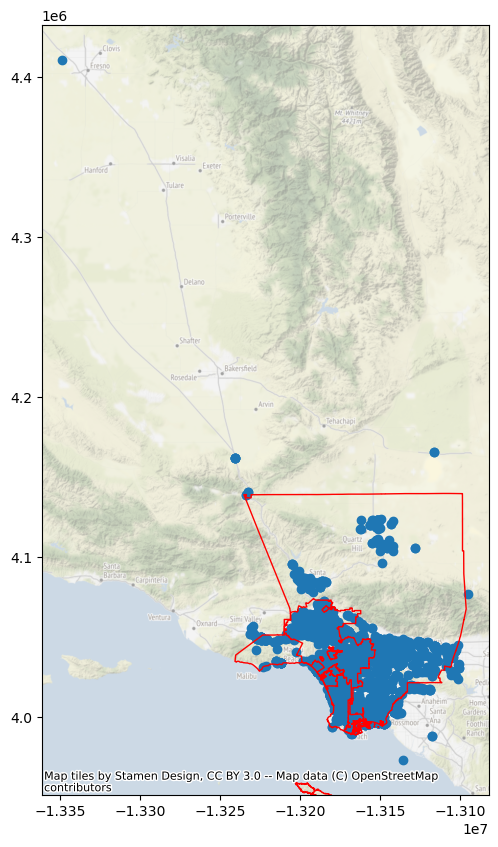

In [29]:
# Plot it
import contextily as ctx
import matplotlib.pyplot as plt

# Define CRS for the GeoDataFrame
gdf = gdf.set_crs(epsg=4326)

fig, ax = plt.subplots(figsize=(10,10))

# Set the y-axis limits to exclude Catalina Island
# ax.set_ylim(3982000, 4151000)

gdf.to_crs('EPSG:3857').plot(ax=ax, legend=True)

ctx.add_basemap(ax=ax, alpha=0.5) # 50% opacity

# Plot the LA city boundary
gdf_LA.to_crs('EPSG:3857').plot(ax=ax, edgecolor='red', facecolor='none', alpha=1, linewidth=1)

# Plot the LA county boundary
LAcountyboundary.to_crs('EPSG:3857').plot(ax=ax, edgecolor='red', facecolor='none', alpha=1, linewidth=1)

# ax.set_title('Number of Snap Store by Tract')

In [12]:
gdf.head(2)

,Unnamed: 0.1,Unnamed: 0,access_code,access_days_time,access_detail_code,cards_accepted,date_last_confirmed,expected_date,fuel_type_code,groups_with_access_code,id,open_date,owner_type_code,status_code,restricted_access,station_name,station_phone,updated_at,facility_type,geocode_status,latitude,longitude,city,intersection_directions,plus4,state,street_address,zip,country,bd_blends,cng_dispenser_num,cng_fill_type_code,cng_psi,cng_renewable_source,cng_total_compression,cng_total_storage,cng_vehicle_class,cng_has_rng,e85_blender_pump,e85_other_ethanol_blends,ev_connector_types,ev_dc_fast_num,ev_level1_evse_num,ev_level2_evse_num,ev_network,ev_network_web,ev_other_evse,ev_pricing,ev_renewable_source,hy_is_retail,hy_pressures,hy_standards,hy_status_link,lng_renewable_source,lng_vehicle_class,lng_has_rng,lpg_primary,lpg_nozzle_types,ng_fill_type_code,ng_psi,ng_vehicle_class,rd_blends,rd_blends_fr,rd_blended_with_biodiesel,rd_max_biodiesel_level,nps_unit_name,access_days_time_fr,intersection_directions_fr,bd_blends_fr,groups_with_access_code_fr,ev_pricing_fr,ev_network_ids,federal_agency,geometry
0,0,0,public,NaN,NaN,NaN,2023-04-30,NaN,ELEC,Public,117709.0,2019-02-07,NaN,E,NaN,Bexco Enterprises,888-998-2546,2023-05-01T00:00:10Z,NaN,GPS,33.979264,-118.105339,Pico Rivera,Charger #640 under repair. Chargers ||availabl...,NaN,CA,8700 Rex Rd,90660.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,4.0,Blink Network,http://www.blinkcharging.com/,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,{'station': ['465ba1dd-d734-8158-93cc-33000041...,NaN,POINT (-118.10534 33.97926)
1,1,1,public,24 hours daily,NaN,NaN,2023-05-01,NaN,ELEC,Public,185373.0,2021-02-25,NaN,E,NaN,"Walmart 2886 (Pico Rivera, CA)",833-632-2778,2023-05-01T00:54:14Z,NaN,GPS,33.986450,-118.104950,Pico Rivera,NaN,NaN,CA,8500 WASHINGTON BLVD,90660.0,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['CHADEMO', 'J1772COMBO']",4.0,NaN,NaN,Electrify America,https://www.electrifyamerica.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,"{'station': ['210019'], 'posts': ['210019-01',...",NaN,POINT (-118.10495 33.98645)


In [148]:
gdf_geo = gdf['geometry']
gdf_mini = gdf[['access_code','open_date','station_name','city','zip','latitude','longitude','ev_connector_types','ev_network','ev_pricing','zip','ev_connector_types','geometry']]

In [34]:
# Bring in CalEnvironScreen data to exclude the data not in CA
esGdf = gpd.read_file('Data/CalEnviroScreen')
esGdf.head(2)


In [38]:
LAcounty = esGdf[esGdf['County']== 'Los Angeles']
LAcounty.head(2)

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,DieselPM_P,Pesticide,PesticideP,Tox_Rel,Tox_Rel_P,Traffic,TrafficP,DrinkWat,DrinkWatP,Lead,Lead_P,Cleanup,CleanupP,GWThreat,GWThreatP,HazWaste,HazWasteP,ImpWatBod,ImpWatBodP,SolWaste,SolWasteP,PollBurd,PolBurdSc,PolBurdP,Asthma,AsthmaP,LowBirtWt,LowBirWP,Cardiovas,CardiovasP,Educatn,EducatP,Ling_Isol,Ling_IsolP,Poverty,PovertyP,Unempl,UnemplP,HousBurd,HousBurdP,PopChar,PopCharSc,PopCharP,Child_10,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry
5692,6.037920e+09,91321,Los Angeles,Santa Clarita,6881,37.794504,71.747353,0.065915,95.270691,9.600230,45.575607,0.143280,49.533292,0.0,0.0,240.936671,37.896974,1125.630067,65.35,670.509446,73.785438,72.026097,81.499685,12.0,68.943636,1.5,10.642537,0.3,50.138981,0.0,0.000000,2.0,52.898053,49.584188,6.054219,69.359054,36.13,35.119641,4.77,46.009751,10.21,31.542871,41.3,90.888383,18.6,84.544593,57.0,89.170854,6.4,61.530453,28.5,87.883397,60.180479,6.242672,65.948059,18.8199,76.5586,4.6214,76.5586,15.2594,0.3779,0.0,4.2581,6695.407818,1.656762e+06,3.5460,"POLYGON ((135258.650 -402745.383, 135455.130 -..."
5693,6.037920e+09,91350,Los Angeles,Santa Clarita,2399,12.056400,18.116490,0.064647,93.627878,10.007159,49.259490,0.133936,46.944617,0.0,0.0,234.842997,37.421855,1100.627828,64.00,586.103379,67.965530,10.043833,3.818526,0.0,0.000000,0.3,2.108584,0.0,0.000000,1.0,12.452751,0.0,0.000000,31.223914,3.812434,20.385812,30.90,26.595214,5.88,72.850911,13.62,58.075773,3.1,11.351557,1.2,8.485587,7.1,4.396985,3.0,17.113483,4.8,0.975919,30.486003,3.162389,20.612708,14.5477,74.6978,10.7545,33.4306,49.6040,1.0004,0.0,4.4185,4568.318508,9.978606e+05,11.5465,"POLYGON ((137014.367 -395334.286, 137043.791 -..."


In [149]:
# Spatially join the two GeoDataFrames
gdf2 = gpd.sjoin(gdf_mini, LAcounty[['Tract','County','geometry']].to_crs("EPSG:4326"), how='inner', op='intersects')
gdf2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3852 entries, 0 to 3959
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   access_code         3852 non-null   object  
 1   open_date           3851 non-null   object  
 2   station_name        3852 non-null   object  
 3   city                3852 non-null   object  
 4   zip                 3852 non-null   float64 
 5   latitude            3852 non-null   float64 
 6   longitude           3852 non-null   float64 
 7   ev_connector_types  3845 non-null   object  
 8   ev_network          3852 non-null   object  
 9   ev_pricing          504 non-null    object  
 10  zip                 3852 non-null   float64 
 11  ev_connector_types  3845 non-null   object  
 12  geometry            3852 non-null   geometry
 13  index_right         3852 non-null   int64   
 14  Tract               3852 non-null   float64 
 15  County              3852 non-n

C:\Users\User\anaconda3\envs\uds\lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



In [129]:
gdf2.head()

,access_code,open_date,station_name,city,zip,ev_connector_types,ev_network,ev_pricing,zip,ev_connector_types,geometry,index_right,Tract,County
0,public,2019-02-07,Bexco Enterprises,Pico Rivera,90660.0,['J1772'],Blink Network,Free,90660.0,['J1772'],POINT (-118.10534 33.97926),6193,6.037502e+09,Los Angeles
1,public,2021-02-25,"Walmart 2886 (Pico Rivera, CA)",Pico Rivera,90660.0,"['CHADEMO', 'J1772COMBO']",Electrify America,NaN,90660.0,"['CHADEMO', 'J1772COMBO']",POINT (-118.10495 33.98645),6193,6.037502e+09,Los Angeles
2,public,2021-10-07,Pico Rivera Towne Center,Pico Rivera,90660.0,['J1772'],Volta,NaN,90660.0,['J1772'],POINT (-118.09994 33.98413),6193,6.037502e+09,Los Angeles
3,public,2022-03-25,Village Walk Pico Rivera,Pico Rivera,90660.0,['J1772'],Volta,NaN,90660.0,['J1772'],POINT (-118.09033 34.00243),7683,6.037501e+09,Los Angeles
4,public,2021-01-27,SCPPA SOUTHWEST,Glendora,91740.0,['J1772'],ChargePoint Network,NaN,91740.0,['J1772'],POINT (-117.82253 34.11796),6168,6.037401e+09,Los Angeles


In [136]:
uniq_access = gdf2['access_code'].unique()
print(uniq_access)

uniq_ev_network = gdf2['ev_network'].unique()
print(uniq_ev_network)

uniq_ev_pricing = gdf2['ev_pricing'].unique()
print(uniq_ev_pricing)

uniq_connector_types = gdf2['ev_connector_types'].unique()
print(uniq_connector_types)

['public' 'private']
['Blink Network' 'Electrify America' 'Volta' 'ChargePoint Network'
 'eVgo Network' 'Non-Networked' 'POWERFLEX' 'EVGATEWAY' 'SHELL_RECHARGE'
 'FLO' 'Tesla Destination' 'WAVE' 'EV Connect' 'Tesla'
 'SemaCharge Network' 'AMPUP' 'EVCS' 'EVRANGE' 'OpConnect' 'CHARGELAB']
['Free' nan '$0.30 per kWh; $0.45 per kWh from 4pm-9pm'
 '$1 per hour; Maximum payment of $3' '$8 per day for a parking permit'
 '$0.45 per kWh from 4pm-9pm; $0.30 per kWh at all other times'
 '$0.28 per kWh; $0.26 per minute above 60 kW and $0.13 per minute at or below 60 kW'
 '$2.00-$10.00/Hr Variable Parking Fee' '$0.13 per kWh'
 '$0.25 per kWh; parking fee' '$5 per session' '$0.30 per kWh'
 '$1.00-$3.00/Hr Variable Parking Fee' 'FREE' '$0.52/kWh Energy Fee'
 '$1.35/Hr Parking Fee , $0.28/kWh Energy Fee' '$1.00/Hr Parking Fee'
 'Free; parking fee' '$1.00-$2.00/Hr Variable Parking Fee' '$0.40 per kWh'
 'Variable parking fee' '$0.28/kWh Energy Fee'
 'Free; parking or permit fee' '$0.30 per kWh; $0.45 p

AttributeError: 'DataFrame' object has no attribute 'unique'

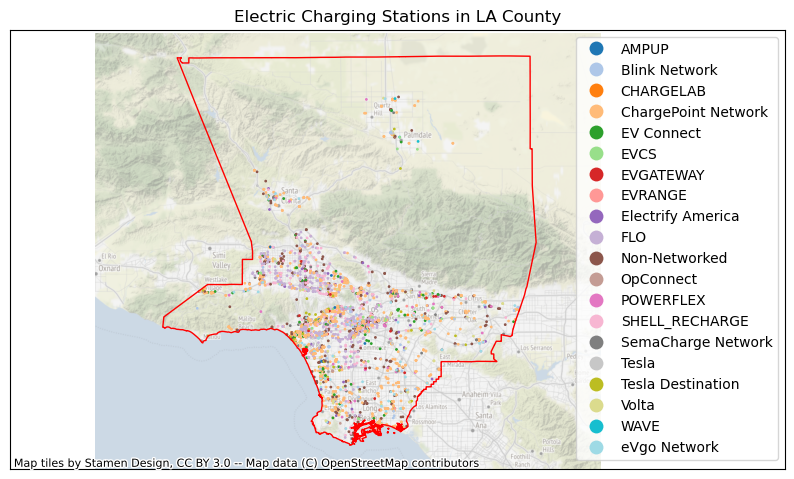

In [160]:
# Plot it
fig, ax = plt.subplots(figsize=(10,10))

# Set the y-axis limits to exclude Catalina Island
# ax.set_ylim(3982000, 4151000)

gdf2.to_crs('EPSG:3857').plot(ax=ax, markersize = 1, column='ev_network', legend=True, cmap='tab20')

ctx.add_basemap(ax=ax, alpha=0.5) # 50% opacity

# Plot the LA city boundary
# gdf_LA.to_crs('EPSG:3857').plot(ax=ax, edgecolor='red', facecolor='none', alpha=1, linewidth=1)

# Plot the LA county boundary
LAcountyboundary.to_crs('EPSG:3857').plot( ax=ax, edgecolor='red', facecolor='none', alpha=1, linewidth=1)

# Set the x-axis and y-axis limits to zoom out slightly
ax.set_xlim(-13300000, -13000000)
ax.set_ylim(3980000, 4150000)

ax.set_title('Electric Charging Stations in LA County')

# take a look and see what happens when you comment out these lines
ax.set_xticks([])
ax.set_yticks([])

plt.show()

In [81]:
# Count the ev number based on census tracts
n_ev = gdf2.groupby('Tract').size()
n_ev.name = 'n_ev'

esGdf_J = LAcounty.join(n_ev, how='left', on = 'Tract')
esGdf_J = esGdf_J.fillna(0)
esGdf_J.head(2)

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,DieselPM_P,Pesticide,PesticideP,Tox_Rel,Tox_Rel_P,Traffic,TrafficP,DrinkWat,DrinkWatP,Lead,Lead_P,Cleanup,CleanupP,GWThreat,GWThreatP,HazWaste,HazWasteP,ImpWatBod,ImpWatBodP,SolWaste,SolWasteP,PollBurd,PolBurdSc,PolBurdP,Asthma,AsthmaP,LowBirtWt,LowBirWP,Cardiovas,CardiovasP,Educatn,EducatP,Ling_Isol,Ling_IsolP,Poverty,PovertyP,Unempl,UnemplP,HousBurd,HousBurdP,PopChar,PopCharSc,PopCharP,Child_10,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,n_ev
5692,6.037920e+09,91321,Los Angeles,Santa Clarita,6881,37.794504,71.747353,0.065915,95.270691,9.600230,45.575607,0.143280,49.533292,0.0,0.0,240.936671,37.896974,1125.630067,65.35,670.509446,73.785438,72.026097,81.499685,12.0,68.943636,1.5,10.642537,0.3,50.138981,0.0,0.000000,2.0,52.898053,49.584188,6.054219,69.359054,36.13,35.119641,4.77,46.009751,10.21,31.542871,41.3,90.888383,18.6,84.544593,57.0,89.170854,6.4,61.530453,28.5,87.883397,60.180479,6.242672,65.948059,18.8199,76.5586,4.6214,76.5586,15.2594,0.3779,0.0,4.2581,6695.407818,1.656762e+06,3.5460,"POLYGON ((135258.650 -402745.383, 135455.130 -...",2.0
5693,6.037920e+09,91350,Los Angeles,Santa Clarita,2399,12.056400,18.116490,0.064647,93.627878,10.007159,49.259490,0.133936,46.944617,0.0,0.0,234.842997,37.421855,1100.627828,64.00,586.103379,67.965530,10.043833,3.818526,0.0,0.000000,0.3,2.108584,0.0,0.000000,1.0,12.452751,0.0,0.000000,31.223914,3.812434,20.385812,30.90,26.595214,5.88,72.850911,13.62,58.075773,3.1,11.351557,1.2,8.485587,7.1,4.396985,3.0,17.113483,4.8,0.975919,30.486003,3.162389,20.612708,14.5477,74.6978,10.7545,33.4306,49.6040,1.0004,0.0,4.4185,4568.318508,9.978606e+05,11.5465,"POLYGON ((137014.367 -395334.286, 137043.791 -...",0.0


In [99]:
# Create a column to show on average how much population served by ev 
esGdf_J['n_ev_srv'] = esGdf_J['TotPop19']/esGdf_J['n_ev']
esGdf_J = esGdf_J.fillna(0)
esGdf_J['n_ev_srv'] = esGdf_J['n_ev_srv'].replace([np.inf, -np.inf], 0.0)
esGdf_J.head(2)

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,DieselPM_P,Pesticide,PesticideP,Tox_Rel,Tox_Rel_P,Traffic,TrafficP,DrinkWat,DrinkWatP,Lead,Lead_P,Cleanup,CleanupP,GWThreat,GWThreatP,HazWaste,HazWasteP,ImpWatBod,ImpWatBodP,SolWaste,SolWasteP,PollBurd,PolBurdSc,PolBurdP,Asthma,AsthmaP,LowBirtWt,LowBirWP,Cardiovas,CardiovasP,Educatn,EducatP,Ling_Isol,Ling_IsolP,Poverty,PovertyP,Unempl,UnemplP,HousBurd,HousBurdP,PopChar,PopCharSc,PopCharP,Child_10,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,n_ev,n_ev_srv
5692,6.037920e+09,91321,Los Angeles,Santa Clarita,6881,37.794504,71.747353,0.065915,95.270691,9.600230,45.575607,0.143280,49.533292,0.0,0.0,240.936671,37.896974,1125.630067,65.35,670.509446,73.785438,72.026097,81.499685,12.0,68.943636,1.5,10.642537,0.3,50.138981,0.0,0.000000,2.0,52.898053,49.584188,6.054219,69.359054,36.13,35.119641,4.77,46.009751,10.21,31.542871,41.3,90.888383,18.6,84.544593,57.0,89.170854,6.4,61.530453,28.5,87.883397,60.180479,6.242672,65.948059,18.8199,76.5586,4.6214,76.5586,15.2594,0.3779,0.0,4.2581,6695.407818,1.656762e+06,3.5460,"POLYGON ((135258.650 -402745.383, 135455.130 -...",2.0,3440.5
5693,6.037920e+09,91350,Los Angeles,Santa Clarita,2399,12.056400,18.116490,0.064647,93.627878,10.007159,49.259490,0.133936,46.944617,0.0,0.0,234.842997,37.421855,1100.627828,64.00,586.103379,67.965530,10.043833,3.818526,0.0,0.000000,0.3,2.108584,0.0,0.000000,1.0,12.452751,0.0,0.000000,31.223914,3.812434,20.385812,30.90,26.595214,5.88,72.850911,13.62,58.075773,3.1,11.351557,1.2,8.485587,7.1,4.396985,3.0,17.113483,4.8,0.975919,30.486003,3.162389,20.612708,14.5477,74.6978,10.7545,33.4306,49.6040,1.0004,0.0,4.4185,4568.318508,9.978606e+05,11.5465,"POLYGON ((137014.367 -395334.286, 137043.791 -...",0.0,0.0


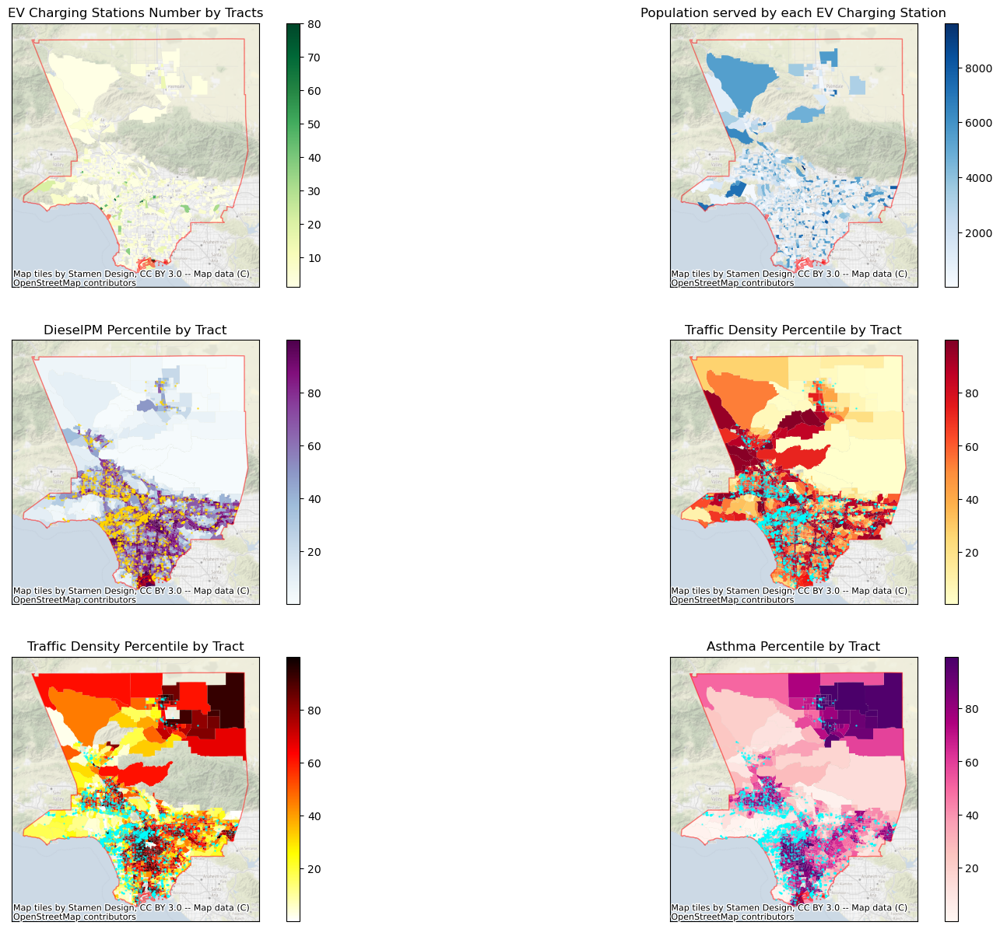

In [125]:
# Plot it
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20,15))

# Electric Charging Stations Number by Tracts in LA County
esGdf_J[esGdf_J['n_ev']>0].to_crs('EPSG:3857').plot('n_ev', ax=axs[0,0], cmap='YlGn',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[0,0], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[0,0].set_ylim(3980000, 4150000)
ctx.add_basemap(ax=axs[0,0], alpha=0.5) # 50% opacity
axs[0,0].set_title('EV Charging Stations Number by Tracts')
axs[0,0].set_xticks([])
axs[0,0].set_yticks([])

# Population served by each Electric Charging Station
esGdf_J[esGdf_J['n_ev_srv']>0].to_crs('EPSG:3857').plot('n_ev_srv', ax=axs[0,1], cmap='Blues',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[0,1], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[0,1].set_ylim(3980000, 4150000)
ctx.add_basemap(ax=axs[0,1], alpha=0.5) # 50% opacity
axs[0,1].set_title('Population served by each EV Charging Station')
axs[0,1].set_xticks([])
axs[0,1].set_yticks([])

# DieselPM Percentile by Tract
esGdf_J[esGdf_J['DieselPM_P']>0].to_crs('EPSG:3857').plot('DieselPM_P', ax=axs[1,0], cmap='BuPu',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[1,0], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[1,0].set_ylim(3980000, 4150000)
gdf2.to_crs('EPSG:3857').plot(ax=axs[1,0], markersize = 0.5, legend=True, alpha=0.5, color='gold' )
ctx.add_basemap(ax=axs[1,0], alpha=0.5) # 50% opacity
axs[1,0].set_title('DieselPM Percentile by Tract')
axs[1,0].set_xticks([])
axs[1,0].set_yticks([])

# Traffic Density Percentile by Tract
esGdf_J[esGdf_J['TrafficP']>0].to_crs('EPSG:3857').plot('TrafficP', ax=axs[1,1], cmap='YlOrRd',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[1,1], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[1,1].set_ylim(3980000, 4150000)
gdf2.to_crs('EPSG:3857').plot(ax=axs[1,1], markersize = 0.5, legend=True, alpha=0.5, color='aqua' )
ctx.add_basemap(ax=axs[1,1], alpha=0.5) # 50% opacity
axs[1,1].set_title('Traffic Density Percentile by Tract')
axs[1,1].set_xticks([])
axs[1,1].set_yticks([])

# Poverty Percentile by Tract
esGdf_J[esGdf_J['PovertyP']>0].to_crs('EPSG:3857').plot('PovertyP', ax=axs[2,0], cmap='hot_r',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[2,0], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[2,0].set_ylim(3980000, 4150000)
gdf2.to_crs('EPSG:3857').plot(ax=axs[2,0], markersize = 0.5, legend=True, alpha=0.5, color='aqua' )
ctx.add_basemap(ax=axs[2,0], alpha=0.5) # 50% opacity
axs[2,0].set_title('Traffic Density Percentile by Tract')
axs[2,0].set_xticks([])
axs[2,0].set_yticks([])

# Asthma Percentile by Tract
esGdf_J[esGdf_J['AsthmaP']>0].to_crs('EPSG:3857').plot('AsthmaP', ax=axs[2,1], cmap='RdPu',legend=True)
LAcountyboundary.to_crs('EPSG:3857').plot( ax=axs[2,1], edgecolor='red', facecolor='none', alpha=0.5, linewidth=1)
axs[2,1].set_ylim(3980000, 4150000)
gdf2.to_crs('EPSG:3857').plot(ax=axs[2,1], markersize = 0.5, legend=True, alpha=0.5, color='aqua' )
ctx.add_basemap(ax=axs[2,1], alpha=0.5) # 50% opacity
axs[2,1].set_title('Asthma Percentile by Tract')
axs[2,1].set_xticks([])
axs[2,1].set_yticks([])


plt.show()

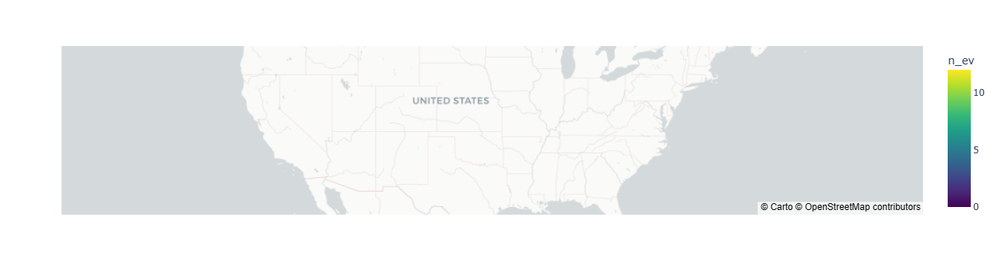

In [147]:
# https://plotly.com/python/maps/
import plotly.express as px
import geopandas as gpd

fig = px.choropleth_mapbox(esGdf_J, geojson=esGdf_J.geometry, locations=esGdf_J.Tract, color='n_ev',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           labels={'unemp':'unemployment rate'})
                           
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
                        

In [157]:
import plotly.express as px

fig = px.scatter_mapbox(gdf2, lat="latitude", lon="longitude", hover_name="station_name", hover_data=["ev_connector_types","ev_network", "ev_pricing"],
                        zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [150]:
gdf2.head(2)

,access_code,open_date,station_name,city,zip,latitude,longitude,ev_connector_types,ev_network,ev_pricing,zip,ev_connector_types,geometry,index_right,Tract,County
0,public,2019-02-07,Bexco Enterprises,Pico Rivera,90660.0,33.979264,-118.105339,['J1772'],Blink Network,Free,90660.0,['J1772'],POINT (-118.10534 33.97926),6193,6.037502e+09,Los Angeles
1,public,2021-02-25,"Walmart 2886 (Pico Rivera, CA)",Pico Rivera,90660.0,33.986450,-118.104950,"['CHADEMO', 'J1772COMBO']",Electrify America,NaN,90660.0,"['CHADEMO', 'J1772COMBO']",POINT (-118.10495 33.98645),6193,6.037502e+09,Los Angeles
